Copyright (c) 2019 OERCompBiomed (UiB)

# Pandas

__[*Pandas*](https://pandas.pydata.org)__ is the premier Python package for data analysis. Pandas is built around the concept of *series* (akin to Numpy vectors) and *data frames* (akin to Numpy matrices). Unlike their Numpy counterparts, Pandas has a rich API that often makes series and data frames more convenient to work with.

First though, let's import Pandas. Conventionally it is given the name `pd`.

**You are encouraged to experiment with all our code!**

NOTE: The original notebook on Github might change over the time, and we recommend that you make a copy of our notebooks before you are editing them. In this respect you might adopt the naming convention my_<'name_of_notebook'>.ipynb, e.g. `my_1.2-pandas-basics.ipynb`

In [1]:
# Import all libraries needed for the tutorial

# General syntax to import specific functions in a library: 
##from (library) import (specific library function)
from pandas import DataFrame, read_csv

# General syntax to import a library but no functions: 
##import (library) as (give the library a nickname/alias)
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd #this is how we usually import pandas
import numpy as np #this is how we usually import numpy
import sys #only needed to determine Python version number
import matplotlib #only needed to determine Matplotlib version number
import tables # pytables is needed to read and write hdf5 files
import openpyxl # is used to read and write MS Excel files

# Enable inline plotting
%matplotlib inline

In [2]:
# Supress some warnings:
import warnings
warnings.filterwarnings('ignore')

In [3]:
print('Python version ' + sys.version)
print('Pandas version ' + pd.__version__)
print('Numpy version ' + np.__version__)
print('Matplotlib version ' + matplotlib.__version__)
print('Seaborn version ' + sns.__version__)

Python version 3.7.4 (default, Aug  9 2019, 18:34:13) [MSC v.1915 64 bit (AMD64)]
Pandas version 0.25.0
Numpy version 1.16.4
Matplotlib version 3.1.0
Seaborn version 0.9.0


## Iris flower data
https://archive.ics.uci.edu/ml/datasets/iris

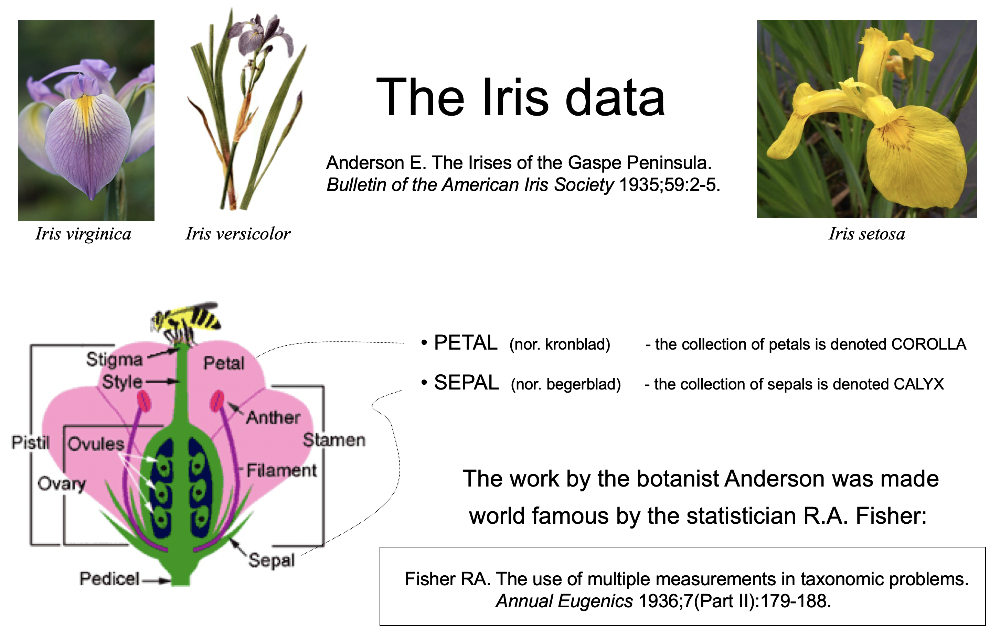

In [4]:
from IPython.display import Image
Image('./assets/iris_data_intro.png', width=900)

**Data Set Information:**

This is perhaps the best known database to be found in the pattern recognition literature. Fisher's paper is a classic in the field and is referenced frequently to this day. (See Duda & Hart, for example.) The data set contains 3 classes of 50 instances each, where each class refers to a type of iris plant. One class is linearly separable from the other 2; the latter are NOT linearly separable from each other. 

Predicted attribute: class of iris plant. 

This is an exceedingly simple domain. 

**Attribute Information:**

1. sepal length in cm 
2. sepal width in cm 
3. petal length in cm 
4. petal width in cm 
5. class: <br>
-- Iris Setosa <br>
-- Iris Versicolour <br>
-- Iris Virginica

Reading original data from UCI MAchine Learning Repository and save locally
```python
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data"
names = ['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth', 'Name']
iris = pd.read_csv(url, names=names)
iris.to_csv('../testdata/iris.data', encoding='utf-8', index=False)
iris.head()
````
Read local data:

In [5]:
iris = pd.read_csv('./testdata/iris.data')

Explore the data

In [6]:
iris.shape

(150, 5)

In [7]:
iris.columns

Index(['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth', 'Name'], dtype='object')

In [8]:
for col in iris.columns:
    print(col)

SepalLength
SepalWidth
PetalLength
PetalWidth
Name


In [9]:
iris.head()

,SepalLength,SepalWidth,PetalLength,PetalWidth,Name
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa


In [10]:
iris.tail()

,SepalLength,SepalWidth,PetalLength,PetalWidth,Name
145,6.7,3.0,5.2,2.3,Iris-virginica
146,6.3,2.5,5.0,1.9,Iris-virginica
147,6.5,3.0,5.2,2.0,Iris-virginica
148,6.2,3.4,5.4,2.3,Iris-virginica
149,5.9,3.0,5.1,1.8,Iris-virginica


In [11]:
iris.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
SepalLength    150 non-null float64
SepalWidth     150 non-null float64
PetalLength    150 non-null float64
PetalWidth     150 non-null float64
Name           150 non-null object
dtypes: float64(4), object(1)
memory usage: 6.0+ KB


### Create a table from data

We now want to recreate a table from an old paper based on the same dataset. First, let us import an image from the paper:

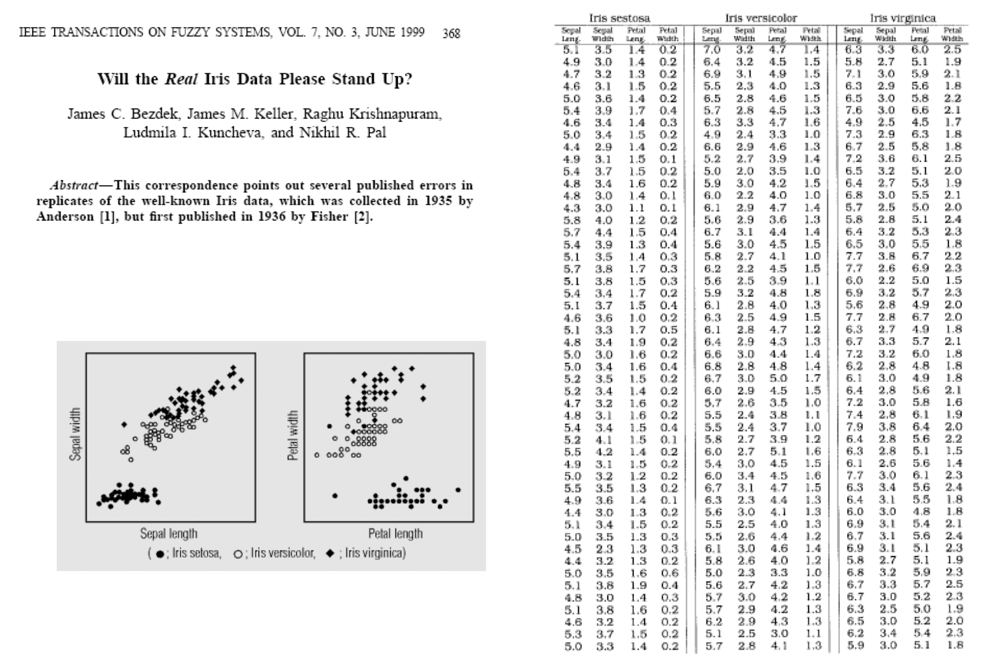

In [12]:
from IPython.display import Image
Image('./assets/iris_data_tabular.png', width=900)

The table in the image is sorted into three tables based on the name of the flower. Each table then present the values from the other four columns. We therefore start by sorting them based on their name.

In [13]:
setosa = iris[iris.Name == 'Iris-setosa'].drop(['Name'], axis=1)
n = len(setosa)
versicolor = iris[iris.Name == 'Iris-versicolor'].drop(['Name'], axis=1)
virginica = iris[iris.Name == 'Iris-virginica'].drop(['Name'], axis=1)

We then print each table using a for loop

In [14]:
print('\t   Iris setosa', '     Iris versicolor', '  Iris virginica')
for k in range(n):
    print(k+1, '\t', setosa.values[k,:], versicolor.values[k,:], virginica.values[k,:])

	   Iris setosa      Iris versicolor   Iris virginica
1 	 [5.1 3.5 1.4 0.2] [7.  3.2 4.7 1.4] [6.3 3.3 6.  2.5]
2 	 [4.9 3.  1.4 0.2] [6.4 3.2 4.5 1.5] [5.8 2.7 5.1 1.9]
3 	 [4.7 3.2 1.3 0.2] [6.9 3.1 4.9 1.5] [7.1 3.  5.9 2.1]
4 	 [4.6 3.1 1.5 0.2] [5.5 2.3 4.  1.3] [6.3 2.9 5.6 1.8]
5 	 [5.  3.6 1.4 0.2] [6.5 2.8 4.6 1.5] [6.5 3.  5.8 2.2]
6 	 [5.4 3.9 1.7 0.4] [5.7 2.8 4.5 1.3] [7.6 3.  6.6 2.1]
7 	 [4.6 3.4 1.4 0.3] [6.3 3.3 4.7 1.6] [4.9 2.5 4.5 1.7]
8 	 [5.  3.4 1.5 0.2] [4.9 2.4 3.3 1. ] [7.3 2.9 6.3 1.8]
9 	 [4.4 2.9 1.4 0.2] [6.6 2.9 4.6 1.3] [6.7 2.5 5.8 1.8]
10 	 [4.9 3.1 1.5 0.1] [5.2 2.7 3.9 1.4] [7.2 3.6 6.1 2.5]
11 	 [5.4 3.7 1.5 0.2] [5.  2.  3.5 1. ] [6.5 3.2 5.1 2. ]
12 	 [4.8 3.4 1.6 0.2] [5.9 3.  4.2 1.5] [6.4 2.7 5.3 1.9]
13 	 [4.8 3.  1.4 0.1] [6.  2.2 4.  1. ] [6.8 3.  5.5 2.1]
14 	 [4.3 3.  1.1 0.1] [6.1 2.9 4.7 1.4] [5.7 2.5 5.  2. ]
15 	 [5.8 4.  1.2 0.2] [5.6 2.9 3.6 1.3] [5.8 2.8 5.1 2.4]
16 	 [5.7 4.4 1.5 0.4] [6.7 3.1 4.4 1.4] [6.4 3.2 5.3 2.3]
17 	 [5.4 3

We can also access a group of values according to column names using `.loc` and matrix transpose (`.T`)

In [15]:
# setosa.loc[:,['SepalLength','SepalWidth', 'PetalLength', 'PetalWidth']].T
setosa.loc[:,['SepalLength','SepalWidth']].T

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
SepalLength,5.1,4.9,4.7,4.6,5.0,5.4,4.6,5.0,4.4,4.9,...,5.0,4.5,4.4,5.0,5.1,4.8,5.1,4.6,5.3,5.0
SepalWidth,3.5,3.0,3.2,3.1,3.6,3.9,3.4,3.4,2.9,3.1,...,3.5,2.3,3.2,3.5,3.8,3.0,3.8,3.2,3.7,3.3


### Create graphs from data

We can make subplots plotting values from different columns against each other like this:

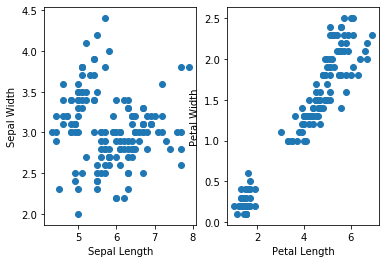

In [16]:
plt.subplot(121)
plt.scatter(iris["SepalLength"], iris["SepalWidth"])
plt.xlabel("Sepal Length")
plt.ylabel("Sepal Width")

plt.subplot(122)
plt.scatter(iris["PetalLength"], iris["PetalWidth"])
plt.xlabel("Petal Length")
plt.ylabel("Petal Width")

plt.show()

**Plotting using seaborn __[pairplot](https://seaborn.pydata.org/generated/seaborn.pairplot.html)__**<br>
Show different levels of a categorical variable by the color of plot elements:

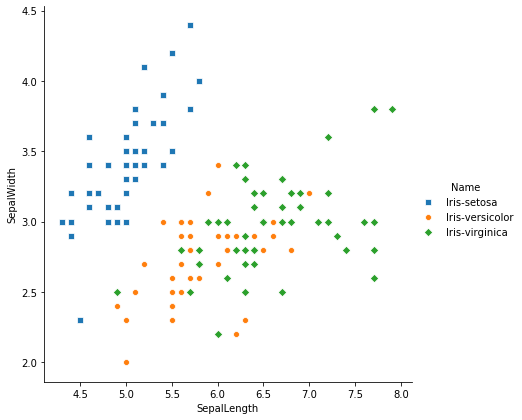

In [17]:
g = sns.pairplot(iris, height=6, x_vars=["SepalLength"], y_vars=["SepalWidth"], hue="Name",
                 markers=["s", "o", "D"])

Or pairplots as a matrix plot with color-encoded class-specific histograms on the diagonal

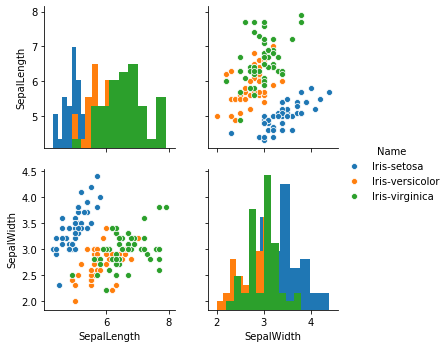

In [18]:
g = sns.pairplot(iris, vars=["SepalLength", "SepalWidth"], hue="Name", diag_kind="hist")

and with color-coded class-specific [KDE](https://en.wikipedia.org/wiki/Kernel_density_estimation)-estimated probability densities on the diagonal

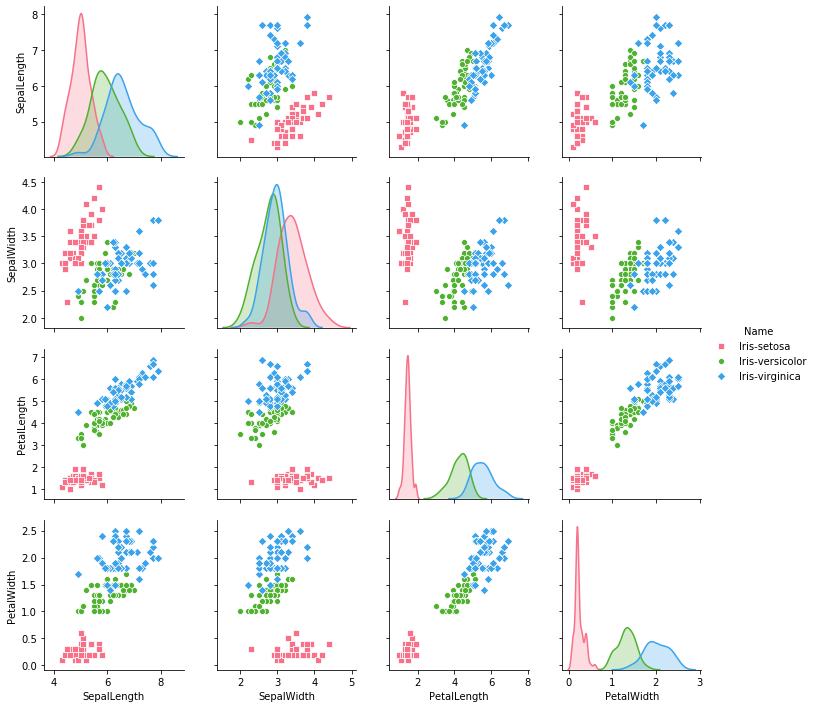

In [19]:
g = sns.pairplot(iris, hue="Name", palette="husl",  markers=["s", "o", "D"], diag_kind="kde")

**Question:** 
 - **Which one of three flowers is easiest to differentiate from the other two flowers based on its Sepal and Petal measurements ?**

### Statistics using Pandas

Let us again look at the seminal Fisher [article](https://onlinelibrary.wiley.com/doi/abs/10.1111/j.1469-1809.1936.tb02137.x) based on this data:

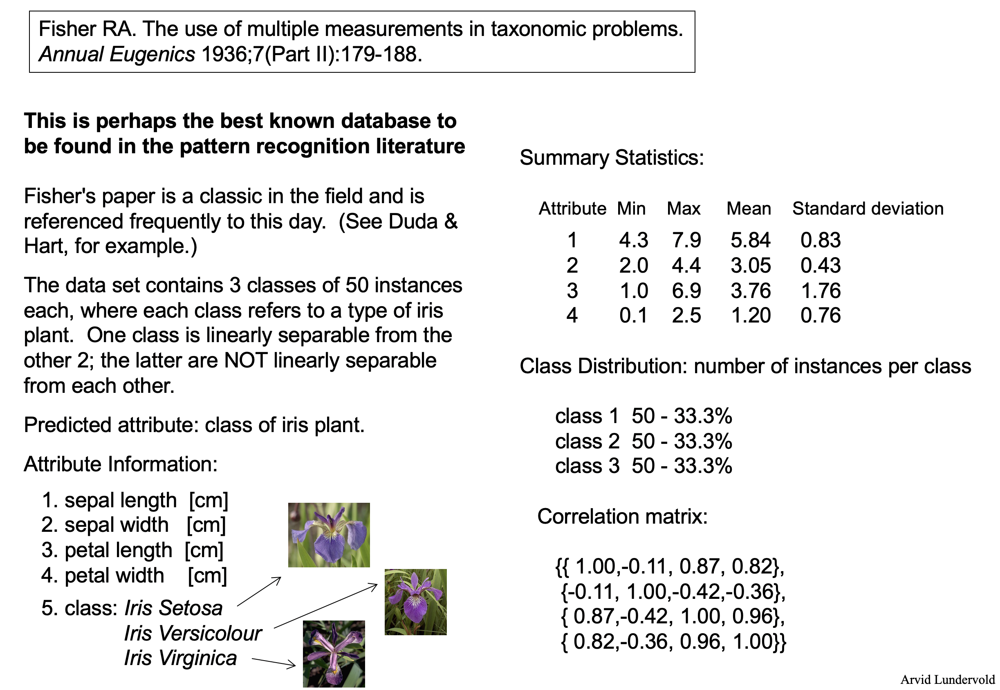

In [20]:
from IPython.display import Image
Image('./assets/iris_data_statistics.png', width=900)

We can use `.describe()` to calculate simple **descriptive statistics** for the dataset (rounding to 3 decimals):

In [21]:
iris.describe().round(3).T

,count,mean,std,min,25%,50%,75%,max
SepalLength,150.0,5.843,0.828,4.3,5.1,5.80,6.4,7.9
SepalWidth,150.0,3.054,0.434,2.0,2.8,3.00,3.3,4.4
PetalLength,150.0,3.759,1.764,1.0,1.6,4.35,5.1,6.9
PetalWidth,150.0,1.199,0.763,0.1,0.3,1.30,1.8,2.5


Computing the **pairwise correlation of columns** (features). Method could be ‘pearson’ (default), ‘kendall’, or ‘spearman’. 

In [22]:
iris.corr().round(2)

,SepalLength,SepalWidth,PetalLength,PetalWidth
SepalLength,1.00,-0.11,0.87,0.82
SepalWidth,-0.11,1.00,-0.42,-0.36
PetalLength,0.87,-0.42,1.00,0.96
PetalWidth,0.82,-0.36,0.96,1.00


Including only string columns in a DataFrame description

In [23]:
iris.describe(include=[np.object])

,Name
count,150
unique,3
top,Iris-virginica
freq,50


In [24]:
iris.describe()

,SepalLength,SepalWidth,PetalLength,PetalWidth
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.054000,3.758667,1.198667
std,0.828066,0.433594,1.764420,0.763161
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


In our case same as excluding numeric columns from a DataFrame description

In [25]:
iris.describe(exclude=[np.number])

,Name
count,150
unique,3
top,Iris-virginica
freq,50


Splitting the object (iris DataFrame) **into groups** (species)

In [26]:
grouped = iris.groupby('Name')

In [27]:
grouped.groups

{'Iris-setosa': Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
             17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
             34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
            dtype='int64'),
 'Iris-versicolor': Int64Index([50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66,
             67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83,
             84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
            dtype='int64'),
 'Iris-virginica': Int64Index([100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112,
             113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125,
             126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138,
             139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
            dtype='int64')}

Describe the group-wise `PetalLength` summary statistics

In [28]:
print('PetalLength:')
grouped['PetalLength'].describe()

PetalLength:


,count,mean,std,min,25%,50%,75%,max
Name,,,,,,,,
Iris-setosa,50.0,1.464,0.173511,1.0,1.4,1.50,1.575,1.9
Iris-versicolor,50.0,4.260,0.469911,3.0,4.0,4.35,4.600,5.1
Iris-virginica,50.0,5.552,0.551895,4.5,5.1,5.55,5.875,6.9


Iterating through the grouped data is very natural

In [29]:
for name, group in grouped:
    print(name,':')
    print(group.describe().round(2).head(3))

Iris-setosa :
       SepalLength  SepalWidth  PetalLength  PetalWidth
count        50.00       50.00        50.00       50.00
mean          5.01        3.42         1.46        0.24
std           0.35        0.38         0.17        0.11
Iris-versicolor :
       SepalLength  SepalWidth  PetalLength  PetalWidth
count        50.00       50.00        50.00       50.00
mean          5.94        2.77         4.26        1.33
std           0.52        0.31         0.47        0.20
Iris-virginica :
       SepalLength  SepalWidth  PetalLength  PetalWidth
count        50.00       50.00        50.00       50.00
mean          6.59        2.97         5.55        2.03
std           0.64        0.32         0.55        0.27


**Group-wise feature correlations**

In [30]:
iris.groupby('Name').corr().round(3)

SepalLength  SepalWidth  PetalLength  PetalWidth
Name                                                                         
Iris-setosa     SepalLength        1.000       0.747        0.264       0.279
                SepalWidth         0.747       1.000        0.177       0.280
                PetalLength        0.264       0.177        1.000       0.306
                PetalWidth         0.279       0.280        0.306       1.000
Iris-versicolor SepalLength        1.000       0.526        0.754       0.546
                SepalWidth         0.526       1.000        0.561       0.664
                PetalLength        0.754       0.561        1.000       0.787
                PetalWidth         0.546       0.664        0.787       1.000
Iris-virginica  SepalLength        1.000       0.457        0.864       0.281
                SepalWidth         0.457       1.000        0.401       0.538
                PetalLength        0.864       0.401        1.000       0.322
                PetalWidth         0.281       0.538        0.322       1.000

DataFrame has an `assign()` method that allows you to easily create new columns that are potentially derived from existing columns.

In [31]:
iris.assign(sepal_ratio = iris['SepalWidth'] / iris['SepalLength']).head().round(3)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Name,sepal_ratio
0,5.1,3.5,1.4,0.2,Iris-setosa,0.686
1,4.9,3.0,1.4,0.2,Iris-setosa,0.612
2,4.7,3.2,1.3,0.2,Iris-setosa,0.681
3,4.6,3.1,1.5,0.2,Iris-setosa,0.674
4,5.0,3.6,1.4,0.2,Iris-setosa,0.720


In the example above, we inserted a precomputed value. <br>
We can also pass in a function of one argument to be evaluated on the DataFrame being assigned to.

In [32]:
iris.assign(sepal_ratio = lambda x: (x['SepalWidth'] /
                                     x['SepalLength'])).head().round(3)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Name,sepal_ratio
0,5.1,3.5,1.4,0.2,Iris-setosa,0.686
1,4.9,3.0,1.4,0.2,Iris-setosa,0.612
2,4.7,3.2,1.3,0.2,Iris-setosa,0.681
3,4.6,3.1,1.5,0.2,Iris-setosa,0.674
4,5.0,3.6,1.4,0.2,Iris-setosa,0.720


`assign` always returns a copy of the data, leaving the original DataFrame untouched, e.g.

In [33]:
iris.head(2)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Name
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa


Passing a callable, as opposed to an actual value to be inserted, is useful when you don’t have a reference to the DataFrame at hand. This is common when using assign``  in a chain of operations. For example, we can limit the DataFrame to just those observations with a Sepal Length greater than 5, calculate the ratio, and plot:

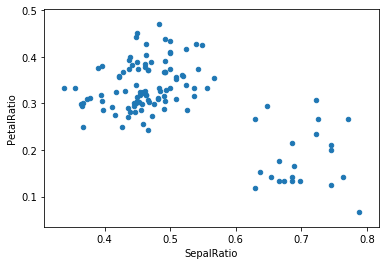

In [34]:
(iris.query('SepalLength > 5')
 .assign(SepalRatio = lambda x: x.SepalWidth / x.SepalLength,
         PetalRatio = lambda x: x.PetalWidth / x.PetalLength)
 .plot(kind='scatter', x='SepalRatio', y='PetalRatio'))

**Questions:** 

 - **What is the mean of SepalWidth for the Iris-setosa?**
 - **Explain with your own words what the assign() method does**

## To go a bit further, we will play a little we the basics of Pandas <br>- taken from "10 Minutes to pandas"
(https://pandas.pydata.org/pandas-docs/stable/10min.html)

You can see more complex recipes in the __[Cookbook](https://pandas.pydata.org/pandas-docs/stable/cookbook.html)__

### Object creation

See also __[Intro to Data Structures](https://pandas.pydata.org/pandas-docs/stable/dsintro.html)__

__[Series](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.Series.html)__ is a one-dimensional labeled array capable of holding any data type (integers, strings, floating point numbers, Python objects, etc.). The axis labels are collectively referred to as the index. 
Creating a Series by passing a list of values, letting pandas create a default integer index:

In [35]:
s = pd.Series([1,3,5,np.nan,6,8])
s

0    1.0
1    3.0
2    5.0
3    NaN
4    6.0
5    8.0
dtype: float64

Creating a __[DataFrame](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.html)__ by passing a NumPy array, with a datetime index and labeled columns:

In [36]:
dates = pd.date_range('20130101', periods=6)
dates

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06'],
              dtype='datetime64[ns]', freq='D')

**DataFrame** is a 2-dimensional labeled data structure with columns of potentially different types. You can think of it like a spreadsheet or SQL table, or a dict of Series objects. It is generally the most commonly used pandas object. Like Series, DataFrame accepts many different kinds of input:

 - Dict of 1D ndarrays, lists, dicts, or Series
 - 2-D numpy.ndarray
 - [Structured or record ndarray](https://docs.scipy.org/doc/numpy/user/basics.rec.html)
 - A `Series`
 - Another `DataFrame`
 
Along with the data, you can optionally pass **index** (row labels) and **columns** (column labels) arguments. If you pass an index and / or columns, you are guaranteeing the index and / or columns of the resulting DataFrame.

In [37]:
df = pd.DataFrame(np.random.randn(6,4), index=dates, columns=list('ABCD'))
df

,A,B,C,D
2013-01-01,1.449894,-0.493228,0.292824,-1.449104
2013-01-02,0.021992,-1.299024,1.159864,-0.693233
2013-01-03,0.710763,0.772297,-1.904167,0.866503
2013-01-04,-1.370883,0.563489,0.266055,0.697778
2013-01-05,0.804161,-1.315766,-0.604353,-1.407291
2013-01-06,0.462337,-0.378630,0.520750,-0.907040


Creating a DataFrame by passing a dict of objects that can be converted to series-like

In [38]:
df2 = pd.DataFrame({ 'A' : 1.,
                    'B' : pd.Timestamp('20130102'),
                    'C' : pd.Series(1,index=list(range(4)),dtype='float32'),
                    'D' : np.array([3] * 4,dtype='int32'),
                    'E' : pd.Categorical(["test","train","test","train"]),
                    'F' : 'foo' })
df2

,A,B,C,D,E,F
0,1.0,2013-01-02,1.0,3,test,foo
1,1.0,2013-01-02,1.0,3,train,foo
2,1.0,2013-01-02,1.0,3,test,foo
3,1.0,2013-01-02,1.0,3,train,foo


The columns of the resulting DataFrame have different dtypes.

In [39]:
df2.dtypes

A           float64
B    datetime64[ns]
C           float32
D             int32
E          category
F            object
dtype: object

If you’re using IPython (Jupyter notebook), tab completion for column names (as well as public attributes) is automatically enabled, ie.  df2.`<TAB>` <br> Here’s a subset of the attributes that will be completed:

```python
df2.<TAB>

 df2.A     df2.E       df2.add            df2.aggregate   df2.append        df2.as_matrix
 df2.B     df2.F       df2.add_prefix     df2.align       df2.apply         df2.asfreq
 df2.C     df2.T       df2.add_suffix     df2.all         df2.applymap      df2.asof       >  
 df2.D     df2.abs     df2.agg            df2.any         df2.as_blocks     df2.assign
```

As you can see, the columns `A`, `B`, `C`, and `D` are automatically tab completed. `E` is there as well; the rest of the attributes have been truncated for brevity.

### Viewing Data

Here is how to view the top and bottom rows of the frame:

In [40]:
df.head()

,A,B,C,D
2013-01-01,1.449894,-0.493228,0.292824,-1.449104
2013-01-02,0.021992,-1.299024,1.159864,-0.693233
2013-01-03,0.710763,0.772297,-1.904167,0.866503
2013-01-04,-1.370883,0.563489,0.266055,0.697778
2013-01-05,0.804161,-1.315766,-0.604353,-1.407291


In [41]:
df.tail()

,A,B,C,D
2013-01-02,0.021992,-1.299024,1.159864,-0.693233
2013-01-03,0.710763,0.772297,-1.904167,0.866503
2013-01-04,-1.370883,0.563489,0.266055,0.697778
2013-01-05,0.804161,-1.315766,-0.604353,-1.407291
2013-01-06,0.462337,-0.378630,0.520750,-0.907040


Display the index, columns, and the underlying NumPy data:

In [42]:
df.index

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06'],
              dtype='datetime64[ns]', freq='D')

In [43]:
df.columns

Index(['A', 'B', 'C', 'D'], dtype='object')

In [44]:
df.values

array([[ 1.44989408, -0.49322791,  0.29282392, -1.4491037 ],
       [ 0.02199215, -1.29902404,  1.15986426, -0.69323303],
       [ 0.71076254,  0.77229713, -1.904167  ,  0.86650342],
       [-1.37088321,  0.5634889 ,  0.26605478,  0.69777771],
       [ 0.80416061, -1.31576611, -0.60435321, -1.4072913 ],
       [ 0.46233656, -0.3786299 ,  0.52074957, -0.90704002]])

`describe()` shows a quick statistic summary of your data:

In [45]:
df.describe()

,A,B,C,D
count,6.000000,6.000000,6.000000,6.000000
mean,0.346377,-0.358477,-0.044838,-0.482064
std,0.962055,0.888624,1.072570,1.022455
min,-1.370883,-1.315766,-1.904167,-1.449104
25%,0.132078,-1.097575,-0.386751,-1.282228
50%,0.586550,-0.435929,0.279439,-0.800137
75%,0.780811,0.327959,0.463768,0.350025
max,1.449894,0.772297,1.159864,0.866503


### Selection

See also the indexing documentation __[Indexing and Selecting Data](https://pandas.pydata.org/pandas-docs/stable/indexing.html)__ 
and  __[MultiIndex / Advanced Indexing](https://pandas.pydata.org/pandas-docs/stable/advanced.html)__

#### Getting

Selecting a single column, which yields a Series, equivalent to `df.A`

In [46]:
df['A']

2013-01-01    1.449894
2013-01-02    0.021992
2013-01-03    0.710763
2013-01-04   -1.370883
2013-01-05    0.804161
2013-01-06    0.462337
Freq: D, Name: A, dtype: float64

Selecting via `[]`, which slices the rows

In [47]:
df[0:3]

,A,B,C,D
2013-01-01,1.449894,-0.493228,0.292824,-1.449104
2013-01-02,0.021992,-1.299024,1.159864,-0.693233
2013-01-03,0.710763,0.772297,-1.904167,0.866503


#### Selection by Label

For more, see __[Selection by Label](https://pandas.pydata.org/pandas-docs/stable/indexing.html)__

In [48]:
# For getting a cross section using a label

df.loc[dates[0]]

A    1.449894
B   -0.493228
C    0.292824
D   -1.449104
Name: 2013-01-01 00:00:00, dtype: float64

In [49]:
# Selecting on a multi-axis by label

df.loc[:,['A','B']]

,A,B
2013-01-01,1.449894,-0.493228
2013-01-02,0.021992,-1.299024
2013-01-03,0.710763,0.772297
2013-01-04,-1.370883,0.563489
2013-01-05,0.804161,-1.315766
2013-01-06,0.462337,-0.378630


In [50]:
# Showing label slicing, both endpoints are included

df.loc['20130102':'20130104',['A','B']]

,A,B
2013-01-02,0.021992,-1.299024
2013-01-03,0.710763,0.772297
2013-01-04,-1.370883,0.563489


In [51]:
# Reduction in the dimensions of the returned object

df.loc['20130102',['A','B']]

A    0.021992
B   -1.299024
Name: 2013-01-02 00:00:00, dtype: float64

In [52]:
# For getting a scalar value

df.loc[dates[0],'A']

1.4498940814504462

In [53]:
# For getting fast access to a scalar (equivalent to the prior method)

df.at[dates[0],'A']

1.4498940814504462

#### Selection by Position

See more in __[Selection by Position](https://pandas.pydata.org/pandas-docs/stable/indexing.html)__

Select via the position of the passed integers

In [54]:
df.iloc[3]

A   -1.370883
B    0.563489
C    0.266055
D    0.697778
Name: 2013-01-04 00:00:00, dtype: float64

By integer slices, acting similar to numpy/python

In [55]:
df.iloc[3:5,0:2]

,A,B
2013-01-04,-1.370883,0.563489
2013-01-05,0.804161,-1.315766


By lists of integer position locations, similar to the numpy/python style

In [56]:
df.iloc[[1,2,4],[0,2]]

,A,C
2013-01-02,0.021992,1.159864
2013-01-03,0.710763,-1.904167
2013-01-05,0.804161,-0.604353


For slicing rows explicitly

In [57]:
df.iloc[1:3,:]

,A,B,C,D
2013-01-02,0.021992,-1.299024,1.159864,-0.693233
2013-01-03,0.710763,0.772297,-1.904167,0.866503


For slicing columns explicitly

In [58]:
df.iloc[:,1:3]

,B,C
2013-01-01,-0.493228,0.292824
2013-01-02,-1.299024,1.159864
2013-01-03,0.772297,-1.904167
2013-01-04,0.563489,0.266055
2013-01-05,-1.315766,-0.604353
2013-01-06,-0.378630,0.520750


For getting a value explicitly

In [59]:
df.iloc[1,1]

-1.2990240434481235

For getting fast access to a scalar (equivalent to the prior method)

In [60]:
df.iat[1,1]

-1.2990240434481235

#### Boolean Indexing

Using a single column’s values to select data

In [61]:
df[df.A > 0]

,A,B,C,D
2013-01-01,1.449894,-0.493228,0.292824,-1.449104
2013-01-02,0.021992,-1.299024,1.159864,-0.693233
2013-01-03,0.710763,0.772297,-1.904167,0.866503
2013-01-05,0.804161,-1.315766,-0.604353,-1.407291
2013-01-06,0.462337,-0.378630,0.520750,-0.907040


Selecting values from a DataFrame where a boolean condition is met

In [62]:
df[df > 0]

,A,B,C,D
2013-01-01,1.449894,NaN,0.292824,NaN
2013-01-02,0.021992,NaN,1.159864,NaN
2013-01-03,0.710763,0.772297,NaN,0.866503
2013-01-04,NaN,0.563489,0.266055,0.697778
2013-01-05,0.804161,NaN,NaN,NaN
2013-01-06,0.462337,NaN,0.520750,NaN


Using the `isin()` method for filtering

In [63]:
df2 = df.copy()
df2['E'] = ['one', 'one','two','three','four','three']
df2

,A,B,C,D,E
2013-01-01,1.449894,-0.493228,0.292824,-1.449104,one
2013-01-02,0.021992,-1.299024,1.159864,-0.693233,one
2013-01-03,0.710763,0.772297,-1.904167,0.866503,two
2013-01-04,-1.370883,0.563489,0.266055,0.697778,three
2013-01-05,0.804161,-1.315766,-0.604353,-1.407291,four
2013-01-06,0.462337,-0.378630,0.520750,-0.907040,three


In [64]:
df2[df2['E'].isin(['two','four'])]

,A,B,C,D,E
2013-01-03,0.710763,0.772297,-1.904167,0.866503,two
2013-01-05,0.804161,-1.315766,-0.604353,-1.407291,four


#### Setting

Setting a new column automatically aligns the data by the indexes

In [65]:
s1 = pd.Series([1,2,3,4,5,6], index=pd.date_range('20130102', periods=6))
s1

2013-01-02    1
2013-01-03    2
2013-01-04    3
2013-01-05    4
2013-01-06    5
2013-01-07    6
Freq: D, dtype: int64

In [66]:
df['F'] = s1
df

,A,B,C,D,F
2013-01-01,1.449894,-0.493228,0.292824,-1.449104,NaN
2013-01-02,0.021992,-1.299024,1.159864,-0.693233,1.0
2013-01-03,0.710763,0.772297,-1.904167,0.866503,2.0
2013-01-04,-1.370883,0.563489,0.266055,0.697778,3.0
2013-01-05,0.804161,-1.315766,-0.604353,-1.407291,4.0
2013-01-06,0.462337,-0.378630,0.520750,-0.907040,5.0


Setting values by label

In [67]:
df.at[dates[0],'A'] = 0
df

,A,B,C,D,F
2013-01-01,0.000000,-0.493228,0.292824,-1.449104,NaN
2013-01-02,0.021992,-1.299024,1.159864,-0.693233,1.0
2013-01-03,0.710763,0.772297,-1.904167,0.866503,2.0
2013-01-04,-1.370883,0.563489,0.266055,0.697778,3.0
2013-01-05,0.804161,-1.315766,-0.604353,-1.407291,4.0
2013-01-06,0.462337,-0.378630,0.520750,-0.907040,5.0


Setting values by position

In [68]:
df.iat[0,1] = 0
df

,A,B,C,D,F
2013-01-01,0.000000,0.000000,0.292824,-1.449104,NaN
2013-01-02,0.021992,-1.299024,1.159864,-0.693233,1.0
2013-01-03,0.710763,0.772297,-1.904167,0.866503,2.0
2013-01-04,-1.370883,0.563489,0.266055,0.697778,3.0
2013-01-05,0.804161,-1.315766,-0.604353,-1.407291,4.0
2013-01-06,0.462337,-0.378630,0.520750,-0.907040,5.0


Setting by assigning with a NumPy array

In [69]:
df.loc[:,'D'] = np.array([5] * len(df))

The result of the prior setting operations

In [70]:
df

,A,B,C,D,F
2013-01-01,0.000000,0.000000,0.292824,5,NaN
2013-01-02,0.021992,-1.299024,1.159864,5,1.0
2013-01-03,0.710763,0.772297,-1.904167,5,2.0
2013-01-04,-1.370883,0.563489,0.266055,5,3.0
2013-01-05,0.804161,-1.315766,-0.604353,5,4.0
2013-01-06,0.462337,-0.378630,0.520750,5,5.0


A `where` operation with setting

In [71]:
df2 = df.copy()
df2[df2 > 0] = -df2
df2

,A,B,C,D,F
2013-01-01,0.000000,0.000000,-0.292824,-5,NaN
2013-01-02,-0.021992,-1.299024,-1.159864,-5,-1.0
2013-01-03,-0.710763,-0.772297,-1.904167,-5,-2.0
2013-01-04,-1.370883,-0.563489,-0.266055,-5,-3.0
2013-01-05,-0.804161,-1.315766,-0.604353,-5,-4.0
2013-01-06,-0.462337,-0.378630,-0.520750,-5,-5.0


### Missing Data

Pandas primarily uses the value `np.nan` to represent missing data. It is by default not included in computations. See the __[Missing Data section](https://pandas.pydata.org/pandas-docs/stable/missing_data.html)__

Reindexing allows you to change/add/delete the index on a specified axis. This returns a copy of the data

In [72]:
df1 = df.reindex(index=dates[0:4], columns=list(df.columns) + ['E'])
df1.loc[dates[0]:dates[1],'E'] = 1
df1

,A,B,C,D,F,E
2013-01-01,0.000000,0.000000,0.292824,5,NaN,1.0
2013-01-02,0.021992,-1.299024,1.159864,5,1.0,1.0
2013-01-03,0.710763,0.772297,-1.904167,5,2.0,NaN
2013-01-04,-1.370883,0.563489,0.266055,5,3.0,NaN


To drop any rows that have missing data

In [73]:
df1.dropna(how='any')

,A,B,C,D,F,E
2013-01-02,0.021992,-1.299024,1.159864,5,1.0,1.0


Filling missing data

In [74]:
df1.fillna(value=5)

,A,B,C,D,F,E
2013-01-01,0.000000,0.000000,0.292824,5,5.0,1.0
2013-01-02,0.021992,-1.299024,1.159864,5,1.0,1.0
2013-01-03,0.710763,0.772297,-1.904167,5,2.0,5.0
2013-01-04,-1.370883,0.563489,0.266055,5,3.0,5.0


To get the boolean mask where values are `nan`

In [75]:
pd.isna(df1)

,A,B,C,D,F,E
2013-01-01,False,False,False,False,True,False
2013-01-02,False,False,False,False,False,False
2013-01-03,False,False,False,False,False,True
2013-01-04,False,False,False,False,False,True


### Operations

See the __[Basic section on Binary Ops](https://pandas.pydata.org/pandas-docs/stable/basics.html)__

#### Stats

Operations in general *exclude* missing data

Performing a descriptive statistic

In [76]:
df.mean()

A    0.104728
B   -0.276272
C   -0.044838
D    5.000000
F    3.000000
dtype: float64

Same operation on the other axis

In [77]:
df.mean(1)

2013-01-01    1.323206
2013-01-02    1.176566
2013-01-03    1.315779
2013-01-04    1.491732
2013-01-05    1.576808
2013-01-06    2.120891
Freq: D, dtype: float64

Operating with objects that have different dimensionality and need alignment. In addition, pandas automatically broadcasts along the specified dimension

In [78]:
s = pd.Series([1,3,5,np.nan,6,8], index=dates).shift(2)
s

2013-01-01    NaN
2013-01-02    NaN
2013-01-03    1.0
2013-01-04    3.0
2013-01-05    5.0
2013-01-06    NaN
Freq: D, dtype: float64

In [79]:
df.sub(s, axis='index')

,A,B,C,D,F
2013-01-01,NaN,NaN,NaN,NaN,NaN
2013-01-02,NaN,NaN,NaN,NaN,NaN
2013-01-03,-0.289237,-0.227703,-2.904167,4.0,1.0
2013-01-04,-4.370883,-2.436511,-2.733945,2.0,0.0
2013-01-05,-4.195839,-6.315766,-5.604353,0.0,-1.0
2013-01-06,NaN,NaN,NaN,NaN,NaN


#### Apply

Applying functions to the data

In [80]:
df.apply(np.cumsum)

,A,B,C,D,F
2013-01-01,0.000000,0.000000,0.292824,5,NaN
2013-01-02,0.021992,-1.299024,1.452688,10,1.0
2013-01-03,0.732755,-0.526727,-0.451479,15,3.0
2013-01-04,-0.638129,0.036762,-0.185424,20,6.0
2013-01-05,0.166032,-1.279004,-0.789777,25,10.0
2013-01-06,0.628369,-1.657634,-0.269028,30,15.0


In [81]:
df.apply(lambda x: x.max() - x.min())

A    2.175044
B    2.088063
C    3.064031
D    0.000000
F    4.000000
dtype: float64

#### Histogramming

See more at __[Histogramming and Discretization](https://pandas.pydata.org/pandas-docs/stable/basics.html)__

In [82]:
s = pd.Series(np.random.randint(0, 7, size=10)); s

0    0
1    3
2    3
3    1
4    4
5    2
6    0
7    0
8    1
9    0
dtype: int32

In [83]:
s.value_counts()

0    4
3    2
1    2
4    1
2    1
dtype: int64

#### String Methods

Series is equipped with a set of string processing methods in the str attribute that make it easy to operate on each element of the array, as in the code snippet below. Note that pattern-matching in str generally uses regular expressions by default (and in some cases always uses them). <br>
See more at __[Vectorized String Methods](https://pandas.pydata.org/pandas-docs/stable/text.html)__

In [84]:
s = pd.Series(['A', 'B', 'C', 'Aaba', 'Baca', np.nan, 'CABA', 'dog', 'cat'])
s.str.lower()

0       a
1       b
2       c
3    aaba
4    baca
5     NaN
6    caba
7     dog
8     cat
dtype: object

### Merge

### Concat

pandas provides various facilities for easily combining together Series, DataFrame, and Panel objects with various kinds of set logic for the indexes and relational algebra functionality in the case of join / merge-type operations.<br>
See the __[Merging section](https://pandas.pydata.org/pandas-docs/stable/merging.html)__

Concatenating pandas objects together with `concat()`:

In [85]:
df = pd.DataFrame(np.random.randn(10, 4)); df

,0,1,2,3
0,0.743650,1.381796,-1.222222,-0.107815
1,-0.513260,-0.754330,0.471139,1.080532
2,0.871282,-0.277714,2.053710,-0.164278
3,0.384432,-0.461642,-0.772495,0.054983
4,0.739633,2.187148,-1.905630,1.222092
5,-0.298851,0.126827,0.669265,2.319749
6,-0.443019,-1.118809,0.002032,0.453024
7,-0.161836,-0.283980,-0.311234,-0.095380
8,-0.605227,0.838747,-0.386254,0.890766
9,-0.086393,-1.436984,-2.164885,-0.684863


In [86]:
# break it into pieces
pieces = [df[:3], df[3:7], df[7:]]
pieces

[          0         1         2         3
 0  0.743650  1.381796 -1.222222 -0.107815
 1 -0.513260 -0.754330  0.471139  1.080532
 2  0.871282 -0.277714  2.053710 -0.164278,
           0         1         2         3
 3  0.384432 -0.461642 -0.772495  0.054983
 4  0.739633  2.187148 -1.905630  1.222092
 5 -0.298851  0.126827  0.669265  2.319749
 6 -0.443019 -1.118809  0.002032  0.453024,
           0         1         2         3
 7 -0.161836 -0.283980 -0.311234 -0.095380
 8 -0.605227  0.838747 -0.386254  0.890766
 9 -0.086393 -1.436984 -2.164885 -0.684863]

In [87]:
 pd.concat(pieces)

,0,1,2,3
0,0.743650,1.381796,-1.222222,-0.107815
1,-0.513260,-0.754330,0.471139,1.080532
2,0.871282,-0.277714,2.053710,-0.164278
3,0.384432,-0.461642,-0.772495,0.054983
4,0.739633,2.187148,-1.905630,1.222092
5,-0.298851,0.126827,0.669265,2.319749
6,-0.443019,-1.118809,0.002032,0.453024
7,-0.161836,-0.283980,-0.311234,-0.095380
8,-0.605227,0.838747,-0.386254,0.890766
9,-0.086393,-1.436984,-2.164885,-0.684863


#### Join

SQL style merges. See the __[Database style joining](https://pandas.pydata.org/pandas-docs/stable/merging.html)__ section

In [88]:
left = pd.DataFrame({'key': ['bar', 'foo'], 'lval': [1, 2]})
right = pd.DataFrame({'key': ['foo', 'bar','bar'], 'rval': [4, 5, 6]})

print('left:\n', left)
print('\nright:\n', right)

left:
    key  lval
0  bar     1
1  foo     2

right:
    key  rval
0  foo     4
1  bar     5
2  bar     6


In [89]:
pd.merge(left, right, on='key')

,key,lval,rval
0,bar,1,5
1,bar,1,6
2,foo,2,4


#### Append

Append rows to a dataframe. See the __[Appending](https://pandas.pydata.org/pandas-docs/stable/merging.html)__ section.

In [90]:
df = pd.DataFrame(np.random.randn(8, 4), columns=['A','B','C','D']); df

,A,B,C,D
0,-0.223602,2.395257,-0.409585,0.274933
1,0.485112,0.040052,-1.070123,-0.404720
2,1.677448,0.010325,-0.921528,-1.267854
3,-0.243788,-0.413728,-0.310864,0.026019
4,-0.748219,-0.500784,-0.989537,-0.725650
5,-1.499809,-1.425092,-0.922042,0.466426
6,-0.124434,0.193132,1.143821,-1.006598
7,-2.298345,-0.726637,0.446518,-1.626237


In [91]:
s = df.iloc[3]; s

A   -0.243788
B   -0.413728
C   -0.310864
D    0.026019
Name: 3, dtype: float64

In [92]:
df.append(s, ignore_index=True)

,A,B,C,D
0,-0.223602,2.395257,-0.409585,0.274933
1,0.485112,0.040052,-1.070123,-0.404720
2,1.677448,0.010325,-0.921528,-1.267854
3,-0.243788,-0.413728,-0.310864,0.026019
4,-0.748219,-0.500784,-0.989537,-0.725650
5,-1.499809,-1.425092,-0.922042,0.466426
6,-0.124434,0.193132,1.143821,-1.006598
7,-2.298345,-0.726637,0.446518,-1.626237
8,-0.243788,-0.413728,-0.310864,0.026019


### Grouping

By “group by” we are referring to a process involving one or more of the following steps:

 - **Splitting** the data into groups based on some criteria
 - **Applying** a function to each group independently
 - **Combining** the results into a data structure

See the __[Grouping section](https://pandas.pydata.org/pandas-docs/stable/groupby.html)__

In [93]:
df = pd.DataFrame({'A' : ['foo', 'bar', 'foo', 'bar',
                          'foo', 'bar', 'foo', 'foo'],
                   'B' : ['one', 'one', 'two', 'three',
                          'two', 'two', 'one', 'three'],
                   'C' : np.random.randn(8),
                   'D' : np.random.randn(8)})
df

,A,B,C,D
0,foo,one,0.950336,-1.359003
1,bar,one,0.189228,0.299591
2,foo,two,0.103765,0.335052
3,bar,three,0.203255,2.117717
4,foo,two,-0.323749,-0.381024
5,bar,two,-1.231184,0.292535
6,foo,one,-0.082633,-1.019236
7,foo,three,-0.051746,-0.345427


Grouping and then applying the `min()` function to the resulting groups

In [94]:
df.groupby('A').min()

,B,C,D
A,,,
bar,one,-1.231184,0.292535
foo,one,-0.323749,-1.359003


Grouping by multiple columns forms a hierarchical index, and again we can apply the `min()` function

In [95]:
df.groupby(['A','B']).min()

C         D
A   B                        
bar one    0.189228  0.299591
    three  0.203255  2.117717
    two   -1.231184  0.292535
foo one   -0.082633 -1.359003
    three -0.051746 -0.345427
    two   -0.323749 -0.381024

### Reshaping

See the sections on __[Hierarchical Indexing](https://pandas.pydata.org/pandas-docs/stable/advanced.html#advanced-hierarchical)__ and __[Reshaping](https://pandas.pydata.org/pandas-docs/stable/reshaping.html#reshaping-stacking)__

#### Stack

In [96]:
tuples = list(zip(*[['bar', 'bar', 'baz', 'baz',
                      'foo', 'foo', 'qux', 'qux'],
                     ['one', 'two', 'one', 'two',
                      'one', 'two', 'one', 'two']]))
tuples

[('bar', 'one'),
 ('bar', 'two'),
 ('baz', 'one'),
 ('baz', 'two'),
 ('foo', 'one'),
 ('foo', 'two'),
 ('qux', 'one'),
 ('qux', 'two')]

In [97]:
index = pd.MultiIndex.from_tuples(tuples, names=['first', 'second'])
index

MultiIndex([('bar', 'one'),
            ('bar', 'two'),
            ('baz', 'one'),
            ('baz', 'two'),
            ('foo', 'one'),
            ('foo', 'two'),
            ('qux', 'one'),
            ('qux', 'two')],
           names=['first', 'second'])

In [98]:
df = pd.DataFrame(np.random.randn(8, 2), index=index, columns=['A', 'B']); df

A         B
first second                    
bar   one     0.241248 -0.451018
      two    -1.872125 -3.997295
baz   one    -1.410828  0.695312
      two     0.120398  0.887034
foo   one     0.735635  2.990660
      two     0.956521  1.248742
qux   one     0.800896 -0.184507
      two    -2.827559 -0.310316

In [99]:
df2 = df[:4]
df2

A         B
first second                    
bar   one     0.241248 -0.451018
      two    -1.872125 -3.997295
baz   one    -1.410828  0.695312
      two     0.120398  0.887034

The __[stack()](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.stack.html#pandas.DataFrame.stack)__ method “compresses” a level in the DataFrame’s columns

In [100]:
stacked = df2.stack()
stacked

first  second   
bar    one     A    0.241248
               B   -0.451018
       two     A   -1.872125
               B   -3.997295
baz    one     A   -1.410828
               B    0.695312
       two     A    0.120398
               B    0.887034
dtype: float64

With a “stacked” DataFrame or Series (having a MultiIndex as the index), the inverse operation of stack() is __[unstack()](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.unstack.html#pandas.DataFrame.unstack)__, which by default unstacks the **last level**:

In [101]:
stacked.unstack()

A         B
first second                    
bar   one     0.241248 -0.451018
      two    -1.872125 -3.997295
baz   one    -1.410828  0.695312
      two     0.120398  0.887034

In [102]:
stacked.unstack(1)

second        one       two
first                      
bar   A  0.241248 -1.872125
      B -0.451018 -3.997295
baz   A -1.410828  0.120398
      B  0.695312  0.887034

In [103]:
stacked.unstack(0)

first          bar       baz
second                      
one    A  0.241248 -1.410828
       B -0.451018  0.695312
two    A -1.872125  0.120398
       B -3.997295  0.887034

#### Pivot Tables

See the section on __[Pivot Tables](https://pandas.pydata.org/pandas-docs/stable/reshaping.html#reshaping-pivot)__

In [104]:
df = pd.DataFrame({'A' : ['one', 'one', 'two', 'three'] * 3,
                    'B' : ['A', 'B', 'C'] * 4,
                    'C' : ['foo', 'foo', 'foo', 'bar', 'bar', 'bar'] * 2,
                    'D' : np.random.randn(12),
                    'E' : np.random.randn(12)})
df

,A,B,C,D,E
0,one,A,foo,-0.616555,-0.024294
1,one,B,foo,1.212475,-0.928917
2,two,C,foo,-0.075997,-0.424118
3,three,A,bar,0.435513,0.073062
4,one,B,bar,-1.753677,-0.621770
5,one,C,bar,0.573039,-0.975263
6,two,A,foo,-1.509848,0.181714
7,three,B,foo,-0.154782,-2.221017
8,one,C,foo,1.009874,-0.520792
9,one,A,bar,-1.012546,0.720311


We can produce pivot tables from this data very easily:

In [105]:
pd.pivot_table(df, values='D', index=['A', 'B'], columns=['C'])

C             bar       foo
A     B                    
one   A -1.012546 -0.616555
      B -1.753677  1.212475
      C  0.573039  1.009874
three A  0.435513       NaN
      B       NaN -0.154782
      C -1.767855       NaN
two   A       NaN -1.509848
      B -0.681433       NaN
      C       NaN -0.075997

### Time Series

Pandas has simple, powerful, and efficient functionality for performing resampling operations during frequency conversion (e.g., converting secondly data into 5-minutely data). This is extremely common in, but not limited to, financial applications. See the __[Time Series section](https://pandas.pydata.org/pandas-docs/stable/timeseries.html#timeseries)__

In [106]:
rng = pd.date_range('1/1/2012', periods=100, freq='S'); rng[:3]

DatetimeIndex(['2012-01-01 00:00:00', '2012-01-01 00:00:01',
               '2012-01-01 00:00:02'],
              dtype='datetime64[ns]', freq='S')

In [107]:
ts = pd.Series(np.random.randint(0, 500, len(rng)), index=rng); ts[:3]

2012-01-01 00:00:00    134
2012-01-01 00:00:01    426
2012-01-01 00:00:02    284
Freq: S, dtype: int32

In [108]:
ts.resample('5Min').sum()

2012-01-01    25802
Freq: 5T, dtype: int32

Time zone representation:

In [109]:
rng = pd.date_range('3/6/2012 00:00', periods=5, freq='D'); rng[:3]

DatetimeIndex(['2012-03-06', '2012-03-07', '2012-03-08'], dtype='datetime64[ns]', freq='D')

In [110]:
ts = pd.Series(np.random.randn(len(rng)), rng); ts

2012-03-06   -0.824449
2012-03-07   -1.590052
2012-03-08    0.776595
2012-03-09    0.564036
2012-03-10    0.169012
Freq: D, dtype: float64

In [111]:
ts_utc = ts.tz_localize('UTC')
ts_utc

2012-03-06 00:00:00+00:00   -0.824449
2012-03-07 00:00:00+00:00   -1.590052
2012-03-08 00:00:00+00:00    0.776595
2012-03-09 00:00:00+00:00    0.564036
2012-03-10 00:00:00+00:00    0.169012
Freq: D, dtype: float64

Converting to another time zone:

In [112]:
ts_utc.tz_convert('US/Eastern')

2012-03-05 19:00:00-05:00   -0.824449
2012-03-06 19:00:00-05:00   -1.590052
2012-03-07 19:00:00-05:00    0.776595
2012-03-08 19:00:00-05:00    0.564036
2012-03-09 19:00:00-05:00    0.169012
Freq: D, dtype: float64

Converting between time span representations:

In [113]:
rng = pd.date_range('1/1/2012', periods=5, freq='M'); rng[:3]

DatetimeIndex(['2012-01-31', '2012-02-29', '2012-03-31'], dtype='datetime64[ns]', freq='M')

In [114]:
ts = pd.Series(np.random.randn(len(rng)), index=rng); ts

2012-01-31   -1.449846
2012-02-29   -1.128286
2012-03-31   -1.687104
2012-04-30   -1.337829
2012-05-31   -0.036173
Freq: M, dtype: float64

In [115]:
ps = ts.to_period(); ps

2012-01   -1.449846
2012-02   -1.128286
2012-03   -1.687104
2012-04   -1.337829
2012-05   -0.036173
Freq: M, dtype: float64

In [116]:
ps.to_timestamp()

2012-01-01   -1.449846
2012-02-01   -1.128286
2012-03-01   -1.687104
2012-04-01   -1.337829
2012-05-01   -0.036173
Freq: MS, dtype: float64

Converting between period and timestamp enables some convenient arithmetic functions to be used. In the following example, we convert a quarterly frequency with year ending in November to 9am of the end of the month following the quarter end:

In [117]:
prng = pd.period_range('1990Q1', '2000Q4', freq='Q-NOV'); prng[:3]

PeriodIndex(['1990Q1', '1990Q2', '1990Q3'], dtype='period[Q-NOV]', freq='Q-NOV')

In [118]:
ts = pd.Series(np.random.randn(len(prng)), prng); ts[:3]

1990Q1   -0.846219
1990Q2    1.065223
1990Q3   -0.411821
Freq: Q-NOV, dtype: float64

In [119]:
ts[-3:]

2000Q2    0.760317
2000Q3   -0.583836
2000Q4   -0.002051
Freq: Q-NOV, dtype: float64

In [120]:
ts.index = (prng.asfreq('M', 'e') + 1).asfreq('H', 's') + 9
ts.head()

1990-03-01 09:00   -0.846219
1990-06-01 09:00    1.065223
1990-09-01 09:00   -0.411821
1990-12-01 09:00   -0.038699
1991-03-01 09:00   -0.279627
Freq: H, dtype: float64

### Categoricals

Pandas can include categorical data in a `DataFrame`. For full docs, see the __[categorical introduction](https://pandas.pydata.org/pandas-docs/stable/categorical.htm)__ and the __[API documentation](https://pandas.pydata.org/pandas-docs/stable/api.html)__

In [121]:
df = pd.DataFrame({"id":[1,2,3,4,5,6], "raw_grade":['a', 'b', 'b', 'a', 'a', 'e']})
df

,id,raw_grade
0,1,a
1,2,b
2,3,b
3,4,a
4,5,a
5,6,e


Convert the raw grades to a categorical data type

In [122]:
df["grade"] = df["raw_grade"].astype("category")
df["grade"]

0    a
1    b
2    b
3    a
4    a
5    e
Name: grade, dtype: category
Categories (3, object): [a, b, e]

Rename the categories to more meaningful names (assigning to `Series.cat.categories` is inplace!)

In [123]:
df["grade"].cat.categories = ["very good", "good", "very bad"]
df

,id,raw_grade,grade
0,1,a,very good
1,2,b,good
2,3,b,good
3,4,a,very good
4,5,a,very good
5,6,e,very bad


Reorder the categories and simultaneously add the missing categories (methods under `Series .cat` return a new `Series` by default)

In [124]:
df["grade"] = df["grade"].cat.set_categories(["very bad", "bad", "medium", "good", "very good"])
df["grade"]

0    very good
1         good
2         good
3    very good
4    very good
5     very bad
Name: grade, dtype: category
Categories (5, object): [very bad, bad, medium, good, very good]

Sorting is per order in the categories, not lexical order

In [125]:
df.sort_values(by="grade")

,id,raw_grade,grade
5,6,e,very bad
1,2,b,good
2,3,b,good
0,1,a,very good
3,4,a,very good
4,5,a,very good


Grouping by a categorical column also shows empty categories

In [126]:
df.groupby("grade").size()

grade
very bad     1
bad          0
medium       0
good         2
very good    3
dtype: int64

### Plotting

See the __[Plotting docs](https://pandas.pydata.org/pandas-docs/stable/visualization.html)__

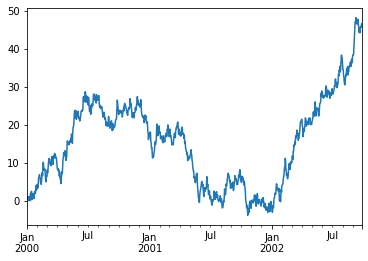

In [127]:
ts = pd.Series(np.random.randn(1000), index=pd.date_range('1/1/2000', periods=1000))
ts = ts.cumsum()
ts.plot()

On a DataFrame, the `plot()` method is a convenience to plot all of the columns with labels

<Figure size 432x288 with 0 Axes>

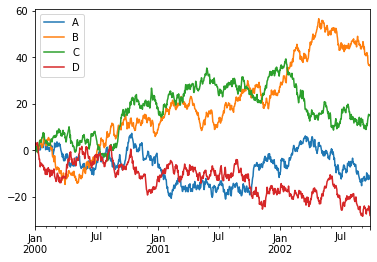

In [128]:
df = pd.DataFrame(np.random.randn(1000, 4), index=ts.index,
columns=['A', 'B', 'C', 'D']) 

df = df.cumsum()
plt.figure(); df.plot(); plt.legend(loc='best')

### Getting Data In/Out

#### CSV

[`Writing to a csv file`](https://pandas.pydata.org/pandas-docs/stable/io.html#io-store-in-csv) 

In [129]:
df.to_csv('./testdata/foo.csv')

[`Reading from a csv file`](https://pandas.pydata.org/pandas-docs/stable/io.html#io-read-csv-table)

In [130]:
pd.read_csv('./testdata/foo.csv').head()

,Unnamed: 0,A,B,C,D
0,2000-01-01,0.980988,0.679501,0.463269,2.042672
1,2000-01-02,0.702799,1.190984,0.596417,3.175622
2,2000-01-03,0.710472,0.846177,0.888021,2.434629
3,2000-01-04,1.512252,2.402425,1.744299,2.787305
4,2000-01-05,1.070127,2.561450,-0.095455,2.709278


To get help on __read_csv__, type: `read_csv?`

In [131]:
# read_csv?

#### HDF5

Reading and writing to [`HDFStores`](https://pandas.pydata.org/pandas-docs/stable/io.html#io-hdf5)

Writing to a HDF5 Store

In [132]:
# pytables is needed
df.to_hdf('./testdata/foo.h5','df')

Reading from a HDF5 Store

In [133]:
pd.read_hdf('./testdata/foo.h5','df').head()

,A,B,C,D
2000-01-01,0.980988,0.679501,0.463269,2.042672
2000-01-02,0.702799,1.190984,0.596417,3.175622
2000-01-03,0.710472,0.846177,0.888021,2.434629
2000-01-04,1.512252,2.402425,1.744299,2.787305
2000-01-05,1.070127,2.561450,-0.095455,2.709278


#### Excel

Reading and writing to [`MS Excel`](https://pandas.pydata.org/pandas-docs/stable/io.html#io-excel)

Writing to an excel file

In [134]:
# openpyxl is needed
df.to_excel('./testdata/foo.xlsx', sheet_name='Sheet1')

Reading from an excel file

In [135]:
pd.read_excel('./testdata/foo.xlsx', 'Sheet1', index_col=None, na_values=['NA']).head()

,Unnamed: 0,A,B,C,D
0,2000-01-01,0.980988,0.679501,0.463269,2.042672
1,2000-01-02,0.702799,1.190984,0.596417,3.175622
2,2000-01-03,0.710472,0.846177,0.888021,2.434629
3,2000-01-04,1.512252,2.402425,1.744299,2.787305
4,2000-01-05,1.070127,2.561450,-0.095455,2.709278


## Going further

-  A handy Pandas *cheat sheet*:  http://pandas.pydata.org/Pandas_Cheat_Sheet.pdf
-  Pandas: .head() to .tail() https://www.youtube.com/watch?v=7vuO9QXDN50  (1:26) <br> 
    w/GitHub repo: https://github.com/TomAugspurger/pydata-chi-h2t
-  Very instructive tutorials:  http://pandas.pydata.org/pandas-docs/stable/tutorials.html
